In [1]:
import imageio
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
print(tf.config.list_physical_devices('GPU'))
print(tf.__version__)


[]
2.19.0-rc0


In [6]:
import genai_art
import genai_art.image
import importlib
importlib.reload(genai_art.image)
from genai_art.image import get_image, display, display_rgb, save_animation

In [187]:
im1 = get_image('6_0')
im2 = get_image('111_0')
im3 = get_image('eye')

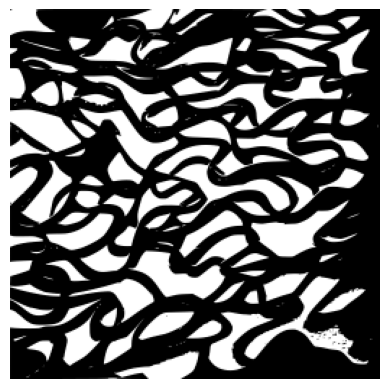

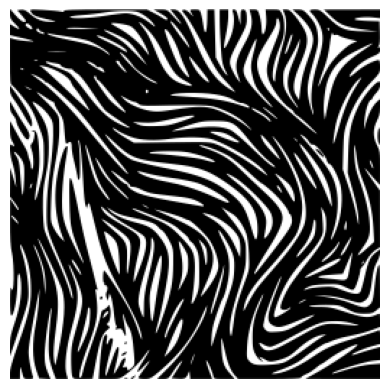

In [188]:
display(im1)
display(im2)
# display(im3)

Activations

In [4]:
# activation functions
def sig(x): # smooth between -1 and 1
    return 1./(1. + np.exp(-x))

def tanh(x): # smooth between 0 and 1
    return np.tanh(x)
    # return tf.keras.activations.tanh(x).numpy()

def gelu(x): # soft clip negative
    # return 0.5*x*(1 + np.tanh(np.sqrt(2/np.pi)*(x + 0.044715*x**3)))
    return tf.keras.activations.gelu(x).numpy()


remapping

In [5]:
# remapping 
def remap_wave_function(image, amp_x=15, freq_x=2*np.pi/10, phase_x=0,
                  amp_y=15, freq_y=2*np.pi/10, phase_y=0):
    h, w = image.shape[:2]
    output = np.ones_like(image) * 255.
    
    for x in range(h):
        for y in range(w):
            # Remap the x and y coordinates using sine functions.
            new_x = int(np.clip(x + amp_x * np.sin(freq_x * y + phase_x), 0, h - 1))
            new_y = int(np.clip(y + amp_y * np.sin(freq_y * x + phase_y), 0, w - 1))
            
            # Assign the pixel from the original image to the new coordinates.
            output[new_x, new_y] = image[x, y]
    
    return output

In [6]:
import numpy as np
import matplotlib.pyplot as plt

def compute_attention_map(h, w, sigma=50):
  # attention map that dense in the center
    x = np.arange(w)
    y = np.arange(h)
    x, y = np.meshgrid(x, y)
    cx, cy = w / 2, h / 2
    attention = np.exp(-((x - cx)**2 + (y - cy)**2) / (2 * sigma**2))
    return attention

def attention_based_remap1(image, attention, amplitude=20):
    h, w = image.shape
    output = np.zeros_like(image)
    cx, cy = h / 2, w / 2

    # Remap each pixel based on its attention weight.
    for x in range(h):
        for y in range(w):
            # Compute a normalized displacement vector from the center.
            # Here, (x - cx, y - cy) indicates the direction from the center.
            dx = (x - cx) / cx  # Normalize to [-1, 1]
            dy = (y - cy) / cy  # Normalize to [-1, 1]
            
            # The attention weight determines how strong the displacement is.
            # Multiply by amplitude to control the maximum shift.
            shift_x = int(np.clip(x + amplitude * attention[x, y] * dx, 0, h - 1))
            shift_y = int(np.clip(y + amplitude * attention[x, y] * dy, 0, w - 1))
            
            # Map the original pixel to the new location.
            output[shift_x, shift_y] = image[x, y]
    
    return output

def attention_based_remap2(image, attention_map, amplitude=20):
    h, w = image.shape
    output = np.zeros_like(image)
    
    # For each pixel, adjust its displacement by the corresponding attention weight.
    for x in range(h):
        for y in range(w):
            # Compute a simple displacement based on attention weight.
            # Here, higher attention means a larger shift.
            shift = int(amplitude * attention_map[x, y])
            
            new_y = (y + shift) % w
            new_x = (x + shift) % h
            
            output[new_x, new_y] = image[x, y]
    return output

def linear_remap(x, y, h, w, w11, w12, w21, w22, b1, b2):
    x_hat = w11*x/h + w21*y/w + b1
    y_hat = w12*x/h + w22*y/w + b2
    return x_hat, y_hat


color/pixels transformations

In [7]:
# color changes
def mix_rgb_channels(r, g, b, alpha, beta, gamma):
    r_hat = r + alpha * (g - r)
    g_hat = g + beta * (b - g)
    b_hat = b + gamma * (r - b)
    return r_hat, g_hat, b_hat

def oscillating_function(t, offset, amplitude, frequency):
    return amplitude*np.sin(frequency * t + offset)

# pixel transformation
def linear_transformation(image, w11, w12, w21, w22, b1, b2):
    return w11*image + w12*image.T + b1, w21*image + w22*image.T + b2



# Grey scale image

## Experiment 1

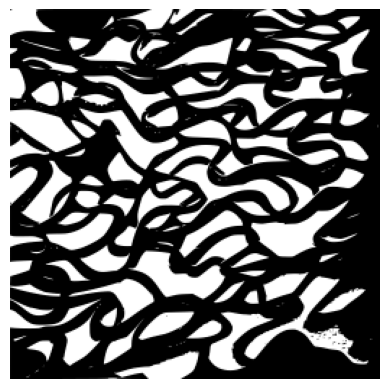

In [9]:
seed_image = get_image('6_0')
# seed_image = seed_image.reshape(256, 256, 1)
display(seed_image)

In [245]:
T = 100
frames = []
w11s = []   
w12s = []
w21s = []
w22s = []
b1s = []
b2s = []
for i in range(T):
  w11 = np.exp(-(i+1)/T) + 1.
  w12 = np.exp(-3*(i+1)/T) + 1.
  w21 = np.log((i+1)/T) + 1.
  w22 = np.log(3*(i+1)/T) + 1.
  b1 = oscillating_function(i, 0, 1, 2*np.pi/T) + 2.
  b2 = oscillating_function(i, 0, 1, 2*np.pi/T) - 2.
  X1, X2 = linear_transformation(seed_image, w11, w12, w21, w22, b1, b2)
  # display(X1)
  # display(X2)
  frame = sig((X1/255.)) + gelu((X2/255.).T)
  # frame = gelu(np.flip(X1)) + gelu((X2).T)
  # display(frame)
  # frame = sig(X1 + X2.T)
  frames.append(frame)
  w11s.append(w11)
  w12s.append(w12)
  w21s.append(w21)
  w22s.append(w22)
  b1s.append(b1)
  b2s.append(b2)

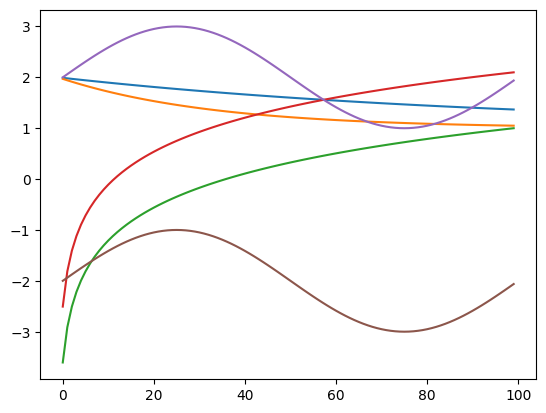

In [246]:
plt.plot(w11s)
plt.plot(w12s)
plt.plot(w21s)
plt.plot(w22s)
plt.plot(b1s)
plt.plot(b2s)


In [247]:
save_animation(frames, 'data/0206/videos/experiment1.gif')

# experiment 2

In [28]:


# remapping 
T = 100
frames = []
w11s = []   
w12s = []
w21s = []
w22s = []
b1s = []
b2s = []
for i in range(T):
  X1 = np.zeros_like(seed_image)
  w11 = 5 * np.exp(-(i+1)/T)
  w12 = 5 * np.exp(-3*(i+1)/T)
  w21 = 5 * np.log((i+1)/T)
  w22 = 5 * np.log(3*(i+1)/T)
  b1 = oscillating_function(i, 1, 1, 2*np.pi/T)
  b2 = oscillating_function(i, -1, 1, 2*np.pi/T)
  h, w = seed_image.shape
  for x in range(h):
    for y in range(w):
      x_hat, y_hat = linear_remap(x, y, h, w, w11, w12, w21, w22, b1, b2)
      x_hat = int(sig(x_hat) * h ) 
      y_hat = int(sig(y_hat) * w ) 
      X1[x_hat, y_hat] = seed_image[x, y]
  frames.append(X1)
  w11s.append(w11)
  w12s.append(w12)
  w21s.append(w21)
  w22s.append(w22)
  b1s.append(b1)
  b2s.append(b2)

# Experiment 2.2
- 2 seed images

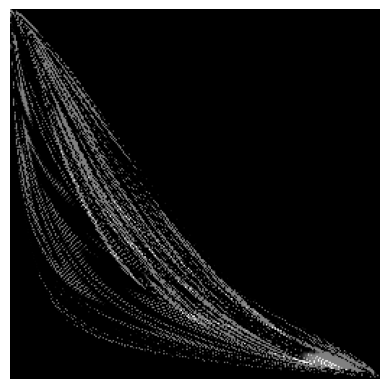

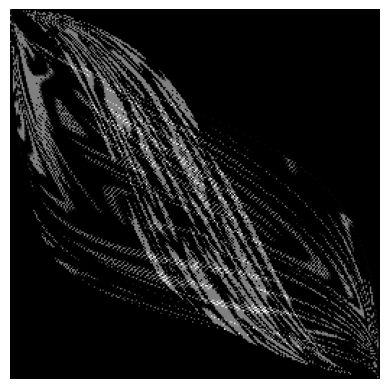

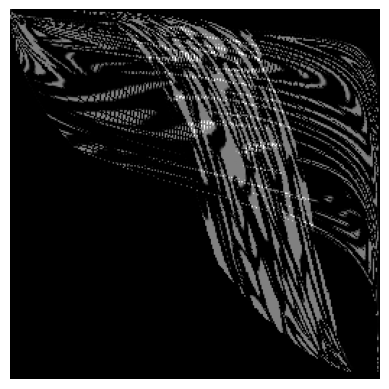

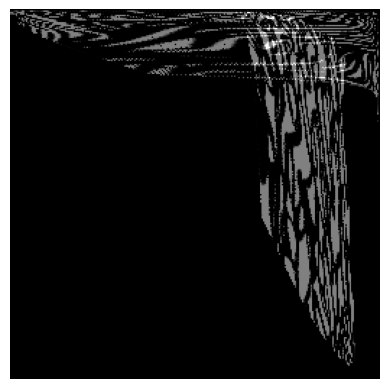

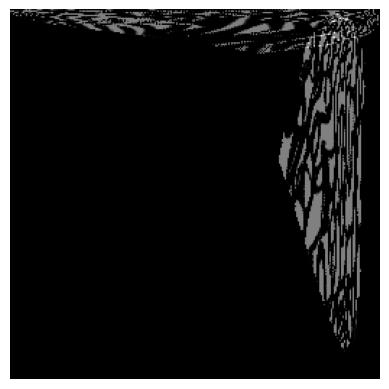

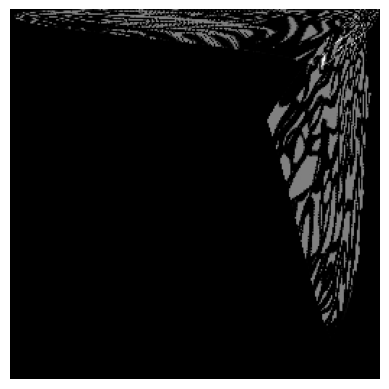

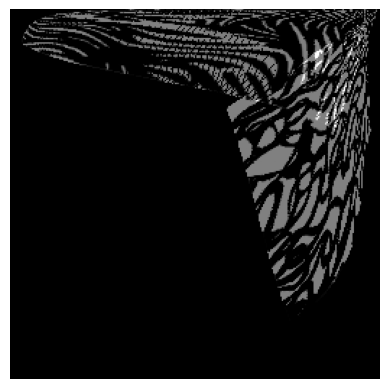

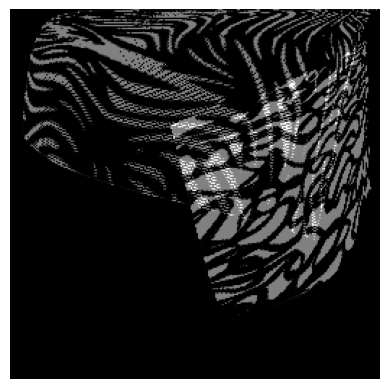

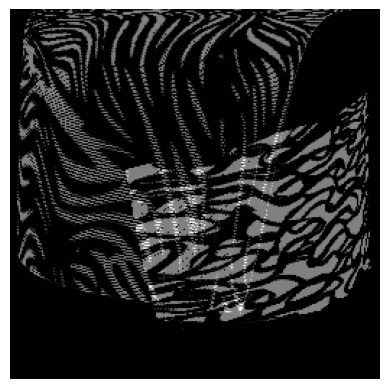

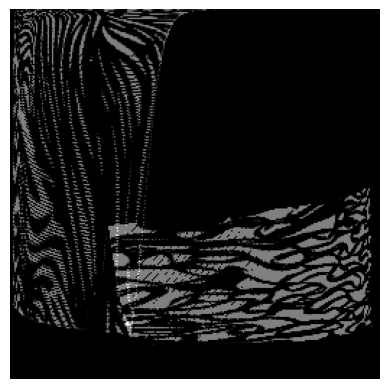

In [34]:

im1 = get_image('6_0')
im2 = get_image('111_0')
# remapping 
T = 100
frames = []
w11s = []   
w12s = []
w21s = []
w22s = []
b1s = []
b2s = []
for i in range(T):
  X1 = np.zeros_like(im1)
  X2 = np.zeros_like(im2)
  w11 = 5 * np.exp(-(i+1)/T)
  w12 = 5 * np.exp(-3*(i+1)/T)
  w21 = 5 * np.log((i+1)/T)
  w22 = 5 * np.log(3*(i+1)/T)
  b1 = oscillating_function(i, 1, 1, 2*np.pi/T)
  b2 = oscillating_function(i, -1, 1, 2*np.pi/T)
  h1, w1 = im1.shape
  h2, w2 = im2.shape
  for x in range(h1):
    for y in range(w1):
      x1_hat, y1_hat = linear_remap(x, y, h1, w1, w11, w12, w21, w22, b1, b2)
      x2_hat, y2_hat = linear_remap(x, y, h2, w2, -2 * w11, -2 * w12, -2 * w21, -2 * w22, -2 * b1, -2 * b2)
      x1_hat = int(sig(x1_hat) * (h1 - 1) ) 
      y1_hat = int(sig(y1_hat) * (w1 - 1) ) 
      x2_hat = int(sig(x2_hat) * (h2 - 1) ) 
      y2_hat = int(sig(y2_hat) * (w2 - 1) ) 
      X1[x1_hat, y1_hat] = im1[x, y]
      X2[x2_hat, y2_hat] = im2[x, y]
  new = X1 + X2.T
  if i % 10 == 0:
    display(new)
  frames.append(new)

In [35]:
save_animation(frames, 'data/0206/videos/experiment2-5.gif')

# Experiment 3 - Ripple 

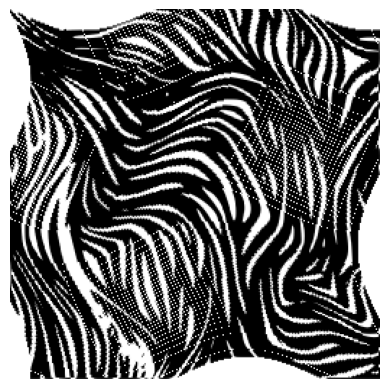

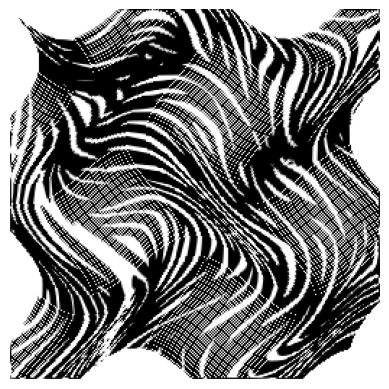

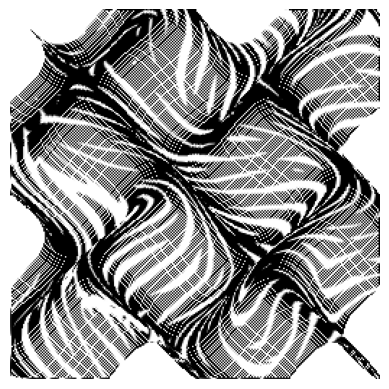

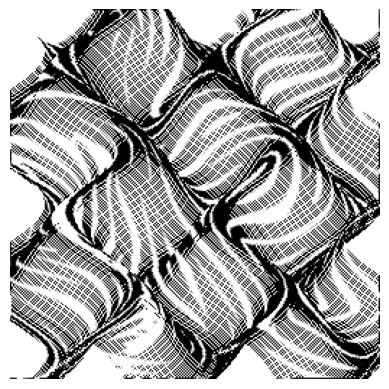

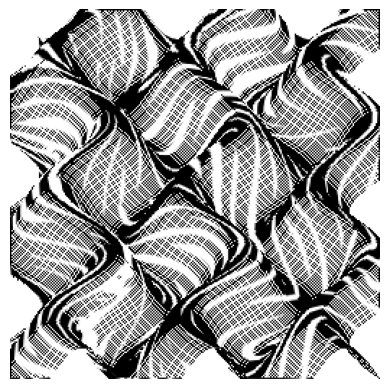

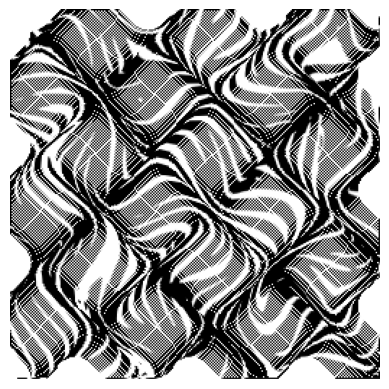

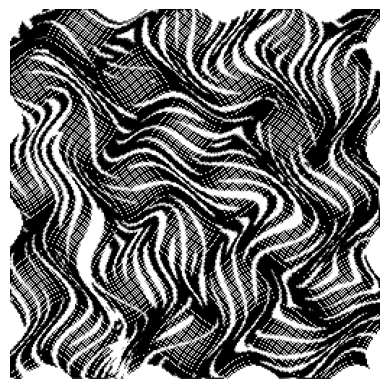

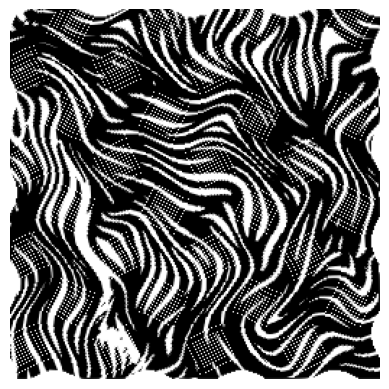

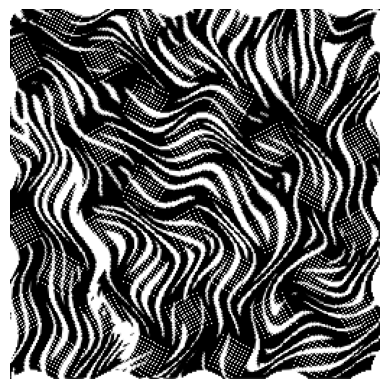

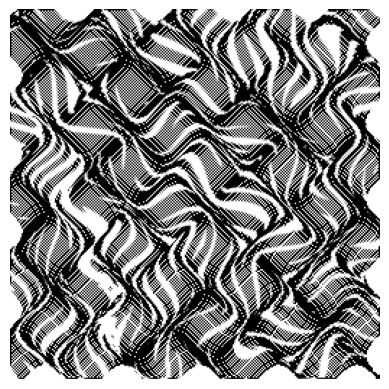

In [47]:
# Create animation with changing wave parameters
T = 100  # number of frames
frames = []

for i in range(T):
    # Create time-varying parameters
    # Amplitude oscillates between 5 and 25
    amp = 15 + 10 * np.sin(2 * np.pi * i / T)
    # Frequency increases over time
    freq = 2 * np.pi * (0.05 + 0.15 * i / T)
    # Phase shifts continuously
    phase = np.pi * i / T
    
    # Apply wave distortion with current parameters
    frame = remap_wave_function(
        im2,
        amp_x=amp,
        freq_x=freq/10.,
        phase_x=phase,
        amp_y=amp,
        freq_y=freq/10.,
        phase_y=phase
    )
    
    # Display every 10th frame to preview
    if i % 10 == 0:
        display(frame)
    
    frames.append(frame/255.0)  # Normalize to [0,1] for save_animation

# # Save the animation
# save_animation(frames, 'data/0206/videos/wave_distortion.gif')

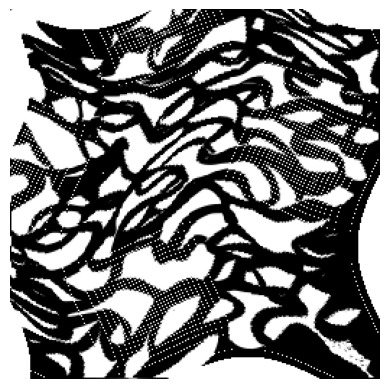

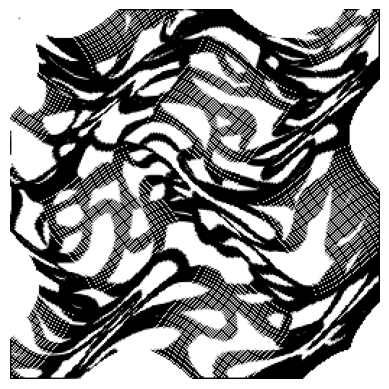

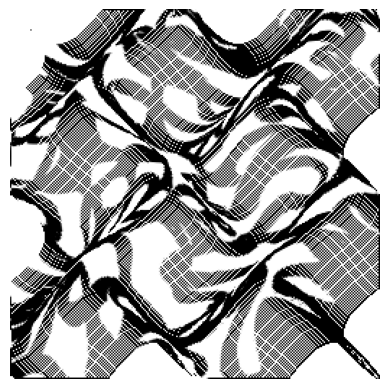

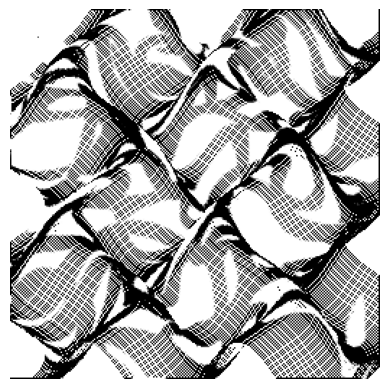

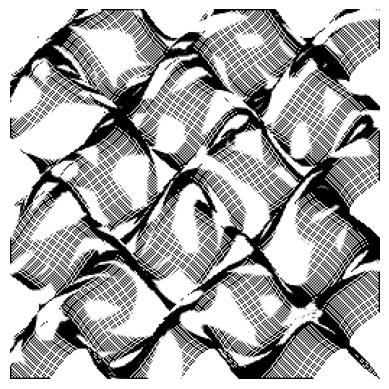

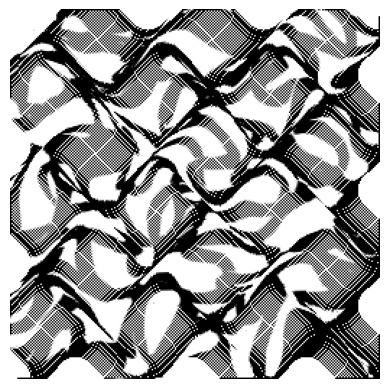

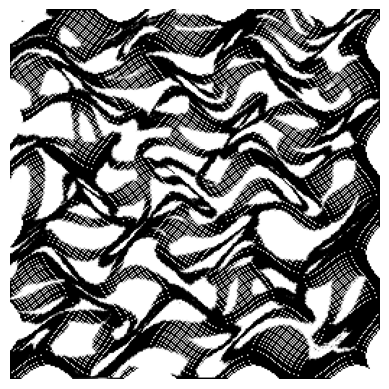

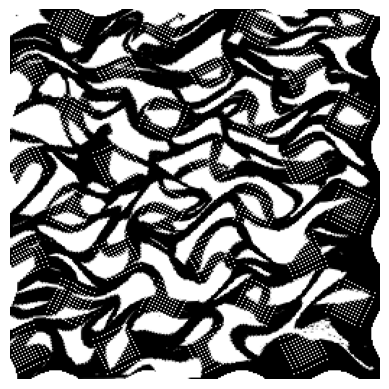

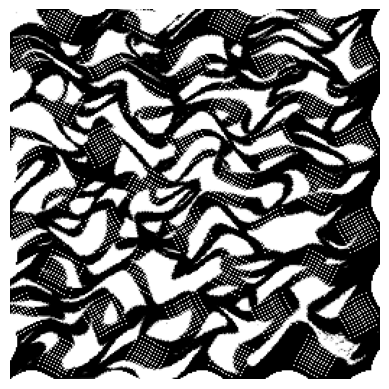

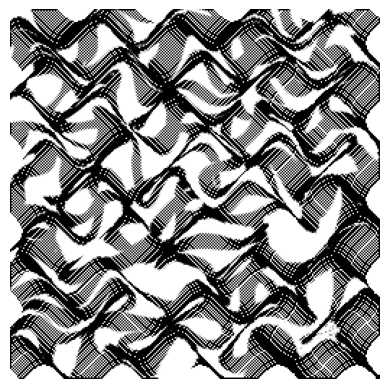

In [49]:
# Create animation with changing wave parameters
T = 100  # number of frames
frames = []

for i in range(T):
    # Create time-varying parameters
    # Amplitude oscillates between 5 and 25
    amp = 15 + 10 * np.sin(2 * np.pi * i / T)
    # Frequency increases over time
    freq = 2 * np.pi * (0.05 + 0.15 * i / T)
    # Phase shifts continuously
    phase = np.pi * i / T
    
    # Apply wave distortion with current parameters
    frame = remap_wave_function(
        im1,
        amp_x=amp,
        freq_x=freq/10.,
        phase_x=phase,
        amp_y=amp,
        freq_y=freq/10.,
        phase_y=phase
    )
    
    # Display every 10th frame to preview
    if i % 10 == 0:
        display(frame)
    
    frames.append(frame/255.0)  # Normalize to [0,1] for save_animation

# # Save the animation
# save_animation(frames, 'data/0206/videos/wave_distortion.gif')

In [50]:
save_animation(frames, 'data/0206/videos/experiment3-6.gif')

# RGB

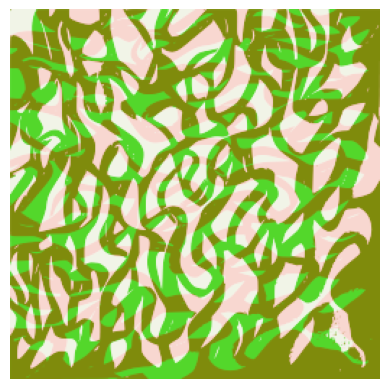

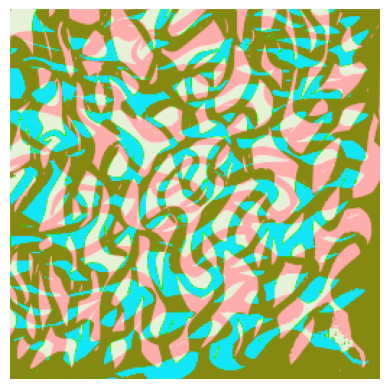

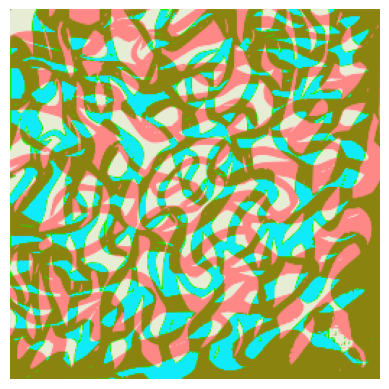

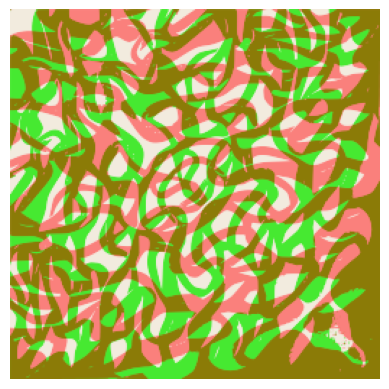

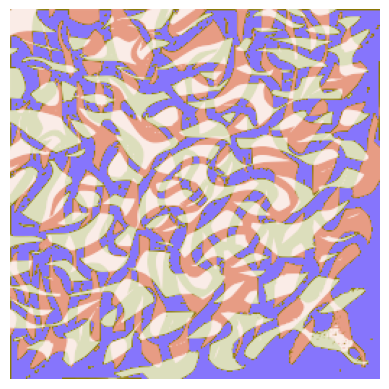

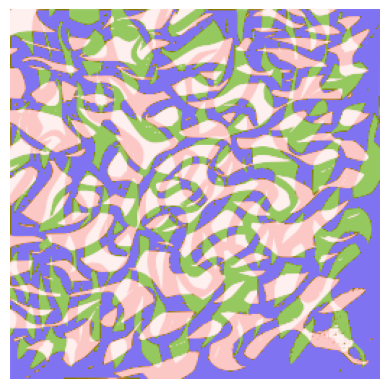

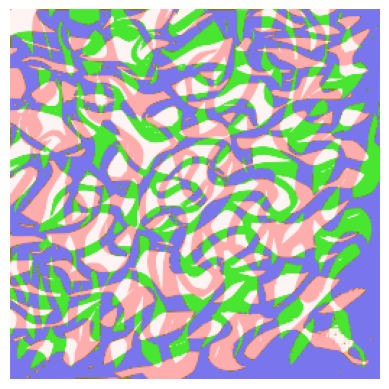

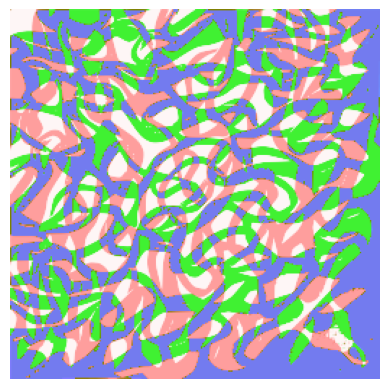

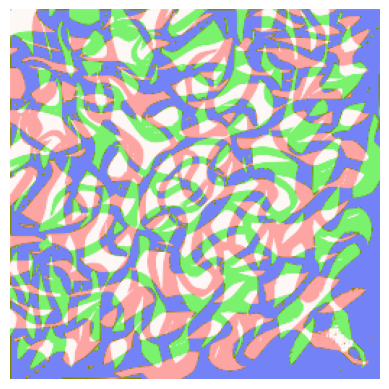

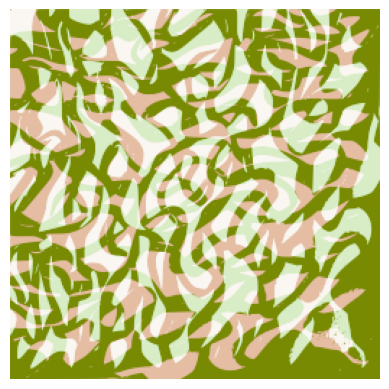

In [98]:
T = 100
seed_image = im1
frames = []
w11s = []   
w12s = []
w21s = []
w22s = []
b1s = []
b2s = []
for i in range(T):
    # More dramatic weight changes
    w11 = oscillating_function(i, 10., 5., 2*np.pi/T) + 2.0  # Oscillates between 0 and 4
    w12 = oscillating_function(i, 10., -3., 2*np.pi/T) + 2.0  # Out of phase with w11
    w21 = oscillating_function(i, 0., 1., 2*np.pi/T) + 1.5  # Faster oscillation
    w22 = oscillating_function(i, 0., -1.5, 2*np.pi/T) + 1.5  # Out of phase with w21
    
    # More dynamic bias terms
    b1 = 50 * np.sin(2 * np.pi * i / T)  # Larger amplitude for more effect
    b2 = 50 * np.cos(2 * np.pi * i / T)  # Out of phase with b1
    
    X1, X2 = linear_transformation(im1, w11, w12, w21, w22, b1, b2)
    X1_2, X2_2 = linear_transformation(im2, w11, w12, w21, w22, b1, b2)
    
    # display(X1)
    # display(X2)
    # Different mixing ratios for RGB channels
    R = 255 * (sig(X1/255.))
    G = 255 * (sig(X2/255.))
    # B = im3 * (0.5 + 0.5 * np.sin(2 * np.pi * i / T))  # Oscillating blue intensity
    B = (R + G) % 255.
    frame = np.stack([R, G, B], axis=-1) / 255
    if i % 10 == 0:
        display_rgb(frame)
    frames.append(frame)


In [99]:
save_animation(frames, 'data/0206/videos/experiment4-3.gif')

# Experiment 5
Remap + RGB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3776562511920929..255.0].


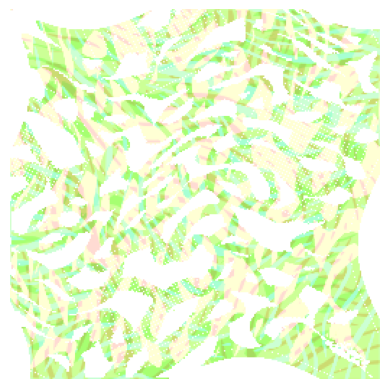

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.32133248448371887..255.0].


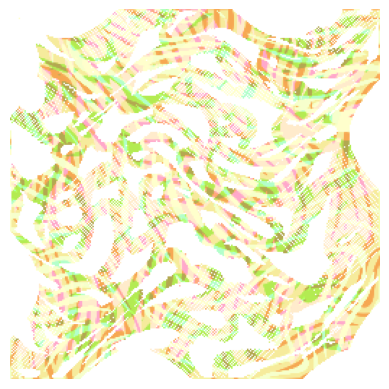

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3816574811935425..255.0].


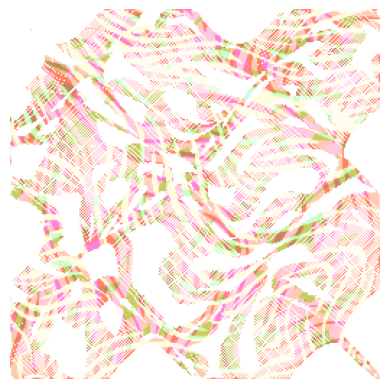

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4427002966403961..255.0].


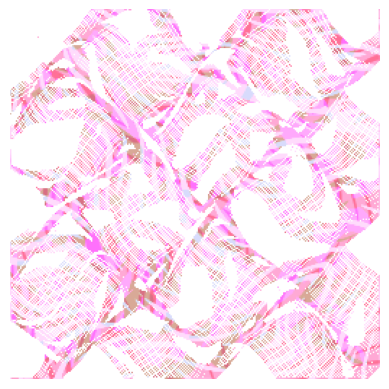

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5888534188270569..255.0].


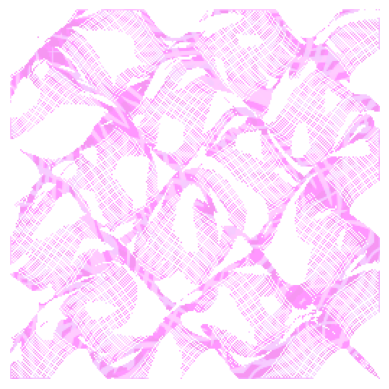

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5921539068222046..255.0].


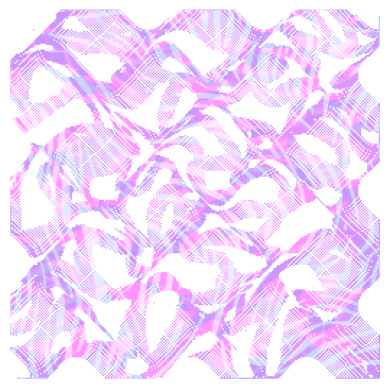

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4852629601955414..255.0].


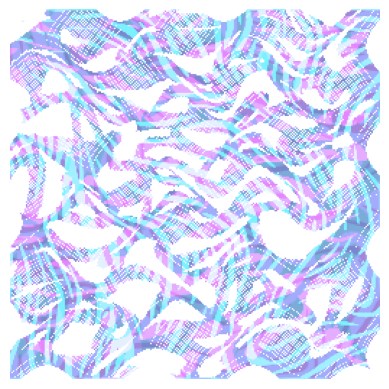

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.380950391292572..255.0].


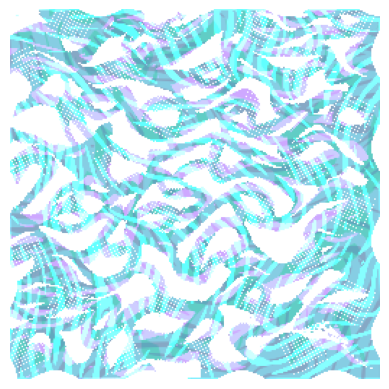

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5275025367736816..255.0].


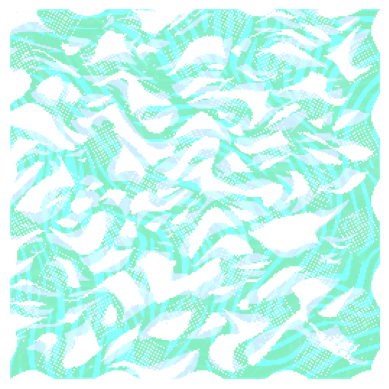

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6313928961753845..255.0].


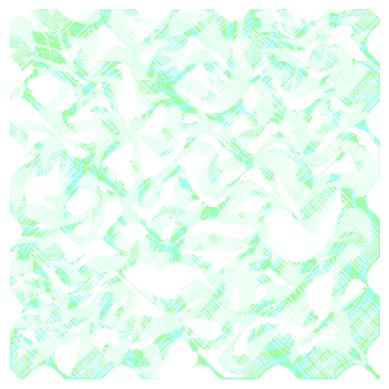

In [184]:
# Create animation with changing wave parameters
T = 100  # number of frames
frames = []

for i in range(T):
    # Wave parameters
    amp = 15 + 10 * np.sin(2 * np.pi * i / T)
    freq = 2 * np.pi * (0.05 + 0.15 * i / T)
    phase = np.pi * i / T
    
    # Apply wave distortion
    distorted = remap_wave_function(
        im1,
        amp_x=amp,
        freq_x=freq/10.,
        phase_x=phase,
        amp_y=amp,
        freq_y=freq/10.,
        phase_y=phase
    )
    w11 = oscillating_function(i, 10., 5., 2*np.pi/T) + 2.0  
    w12 = oscillating_function(i, 10., -3., 2*np.pi/T) + 2.0  
    w21 = oscillating_function(i, 0., 1., 2*np.pi/T) + 1.5  
    w22 = oscillating_function(i, 0., -1.5, 2*np.pi/T) + 1.5  
    b1 = 50 * np.sin(2 * np.pi * i / T)  # Larger amplitude for more effect
    b2 = 50 * np.cos(2 * np.pi * i / T)  # Out of phase with b1
    x1, _ = linear_transformation(im1, w11, w12, w21, w22, b1, b2)
    x2, _ = linear_transformation(im2, w11, w12, w21, w22, b1, b2)
    # Create mask for non-white pixels (white is 255)
    mask = (distorted < 100)  # Using 100 as threshold to account for potential noise
    
    # Create base white image
    rgb_frame = np.ones((distorted.shape[0], distorted.shape[1], 3)) * 255
    
    # Only process pixels where mask is True
    if mask.any():  # Only process if there are any non-white pixels
        r_mult = 0.3*np.tanh(x1/255.) + 0.5
        g_mult = 0.3*np.tanh(x2/255.) + 0.5
        b_mult = 0.3*np.tanh((x1 + x2) / 255.) + 0.5
        
        # Create initial RGB channels (only for masked pixels)
        R = np.zeros_like(distorted)
        G = np.zeros_like(distorted)
        B = np.zeros_like(distorted)
        
        
        # Compute alpha, beta, gamma as functions of the frame index i
        alpha = 0.5 + 0.3 * np.sin(2 * np.pi * i / T)
        beta  = 0.5 + 0.3 * np.sin(2 * np.pi * i / T + 2 * np.pi / 3)
        gamma = 0.5 + 0.3 * np.sin(2 * np.pi * i / T + 4 * np.pi / 3)

        # Apply the mixed colors only to masked pixels in the final frame
        R[mask] += (r_mult[mask] + alpha) * .8
        G[mask] += (g_mult[mask] + beta) * .8
        B[mask] += (b_mult[mask] + gamma) * .8
        
        # Apply the mixed colors only to masked pixels in the final frame
        rgb_frame[mask, 0] = R[mask]
        rgb_frame[mask, 1] = G[mask]
        rgb_frame[mask, 2] = B[mask]
    
    # Display every 10th frame to preview
    if i % 10 == 0:
        display_rgb(rgb_frame)
    
    frames.append(rgb_frame)

# Save the animation
# save_animation(frames, 'data/0206/videos/wave_distortion_rgb_mixed_masked.gif')

In [185]:
save_animation(frames, 'data/0206/videos/experiment5-5.gif')

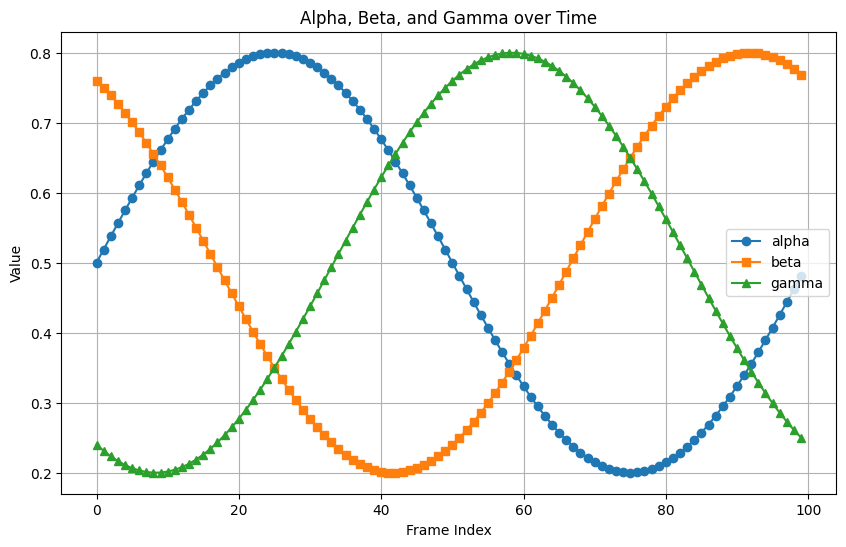

In [174]:

T = 100
time_steps = np.arange(T)


alpha = 0.5 + 0.3 * np.sin(2 * np.pi * time_steps / T)
beta  = 0.5 + 0.3 * np.sin(2 * np.pi * time_steps / T + 2 * np.pi / 3)
gamma = 0.5 + 0.3 * np.sin(2 * np.pi * time_steps / T + 4 * np.pi / 3)


plt.figure(figsize=(10, 6))
plt.plot(time_steps, alpha, label='alpha', linestyle='-', marker='o')
plt.plot(time_steps, beta, label='beta', linestyle='-', marker='s')
plt.plot(time_steps, gamma, label='gamma', linestyle='-', marker='^')

plt.xlabel('Frame Index')
plt.ylabel('Value')
plt.title('Alpha, Beta, and Gamma over Time')
plt.legend()
plt.grid(True)
plt.show()

In [142]:
save_animation(frames, 'data/0206/videos/experiment5-2.gif')